# Simulation of Hyper-Spectral Imagery (HSI) bands from PRISMA bands

This notebook implements the simulation chain to simulate HSI bands starting from PRISMA images. The processing chain is outlined in the _IMAGIN-e: DataDesign Document_ document. 

The aim of this challenge is to create an AI-based application that will be deployed on board of the Internation Space Station (ISS), which will feature a HSI payload. In order to train your AI-based models, we simulate HSI imagery starting from PRISMA imagery, which are spectrally overlapping. PRISMA is a hyper-spectral mission launched and maintained by the [Italian Space Agency](https://www.asi.it/en/earth-science/prisma/). This notebook will allow you to simulate HSI images starting from PRISMA images. To download PRISMA images for your own location, consult [ASI's registration page](https://prismauserregistration.asi.it/). As part of this challenge, we simulated HSI imagery for approximately 500 locations covering the entire Earth's land cover. The pre-simulated images are available to download through Sentinel Hub. Consult the data section on the challenge website for more information.

This notebook showcases how to simulate the data using [eo-learn](https://eo-learn.readthedocs.io/en/latest/index.html), a Python library specifically designed to deal with Earth Observation data. The data will be stored into EOPatches as numpy arrays and geopandas dataframes to facilitate processing operations. The output imagery is by default saved in the GeoTiff file format.

The simulation workflow can be summarised as follows:

 * convert the PRISMA image from the HDF5 format to an EOPatch;
 * sort the bands by increasing spectral wavelength and resample spectral bands to HSI specifications;
 * spatial resampling to HSI pixel size;
 * simulate band-to-band misalignment;
 * simulate signal degradation due to Signal-to-Noise Ratio (SNR);
 * simulate signal degradation due to Module Transfer Function (MTF);
 * simulate L1C reflectances if required;
 * split the AOI into a smaller set of image patches;
 * save bands and masks for the image patches to generate an AI-ready dataset.

Content of the notebook is as follows:

1. [Conversion to EOpatch](#eopatch)
2. [Spectral resampling](#spectral)
3. [Spatial Resampling](#spatial)
4. [Band Misalignment](#misalignment)
5. [Noise Calculation](#snr)
6. [Simulate PSF Filtering](#psf)
7. [Compute L1C](#l1c)
8. [Gridding](#gridding)
9. [Export to Tiff](#export)
10. [Create Workflow](#workflow)

To run the notebook, install the Python libraries listed in the provided `requirements.txt` file, for instance by running `pip install-r requirements.txt`.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os

import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline

from eolearn.core import (
    FeatureType,
    RemoveFeatureTask,
    linearly_connect_tasks,
    EOWorkflow,
    EOExecutor,
)

from prisma_utils import (
    ReadAndPreprocessPrismaTask,
    MergeAndSortTask,
    get_extent,
    ExportGridToTiff,
    RemoveBandsTask,
    SpectralResamplingTask,
    ResizeTask,
    GriddingTask,
    HSICalculationTask,
    BandMisalignmentTask,
    CalculateReflectanceTask,
)
from prisma_constants import HSI_CW, HSI_PIX_SIZE, PRISMA_PIX_SIZE, ProcessingLevels

<div class="alert alert-block alert-info"> <b>NOTE</b> Define the processing level you want to simulate. </div> 

The difference between the two levels is that for L1B radiances are simulated, while for L1C reflectances are simulated.

In [3]:
ProcessingLevels._member_names_

['L1B', 'L1C']

In [4]:
PROCESSING_LEVEL = ProcessingLevels.L1C

## 1. Import PRISMA images to EOPatches  <a name="eopatch"></a>

In the cell below specify the ouput directory where the temporary files are stored, as well as the location of the input PRISMA image in `.he5` format. The input filename needs to be provided at the execute time of the task for each of the images to be processed.

In [5]:
input_path = "<directory with PRISMA files>"
filename = "<filename of PRISMA file to simulate>"

In [6]:
preprocess_task = ReadAndPreprocessPrismaTask()

In [7]:
eop = preprocess_task.execute(eopatch=None, filename=os.path.join(input_path, filename))

/home/dperessutti/venvs/ai4eo/lib64/python3.10/site-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = writer(


Executing command: 
gdal_translate -of GTiff -a_srs EPSG:4326 -gcp 0 0 9.441085815429688 39.998783111572266 -gcp 999 0 9.808917999267578 39.92639923095703 -gcp 999 999 9.722017288208008 39.665611267089844 -gcp 0 999 9.356133460998535 39.737693786621094 /tmp/tmp5t6huj2h/vnirCube.tiff /tmp/tmp5t6huj2h/vnirCubeWithCorners.tiff
Input file size is 1000, 1000
0...10...20...30...40...50...60...70...80...90...100 - done.

Executing command: 
gdal_translate -of GTiff -a_srs EPSG:4326 -gcp 0 0 9.441085815429688 39.998783111572266 -gcp 999 0 9.808917999267578 39.92639923095703 -gcp 999 999 9.722017288208008 39.665611267089844 -gcp 0 999 9.356133460998535 39.737693786621094 /tmp/tmp5t6huj2h/swirCube.tiff /tmp/tmp5t6huj2h/swirCubeWithCorners.tiff
Input file size is 1000, 1000
0...10...20...30...40...50...60...70...80...90...100 - done.

Executing command: 
gdalwarp -t_srs EPSG:32632 -tr 30.000 30.000 -overwrite /tmp/tmp5t6huj2h/vnirCubeWithCorners.tiff /tmp/tmp5t6huj2h/vnirCubeWarped_EPSG_32632.tif

In [8]:
eop

EOPatch(
  data={
    swir: numpy.ndarray(shape=(1, 1229, 1288, 173), dtype=float32)
    vnir: numpy.ndarray(shape=(1, 1229, 1288, 66), dtype=float32)
  }
  meta_info={
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.4554571174, 4427707.156956533)), crs=CRS('32632'))
  timestamp=[datetime.datetime(2020, 6, 4, 10, 28, 29)]
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


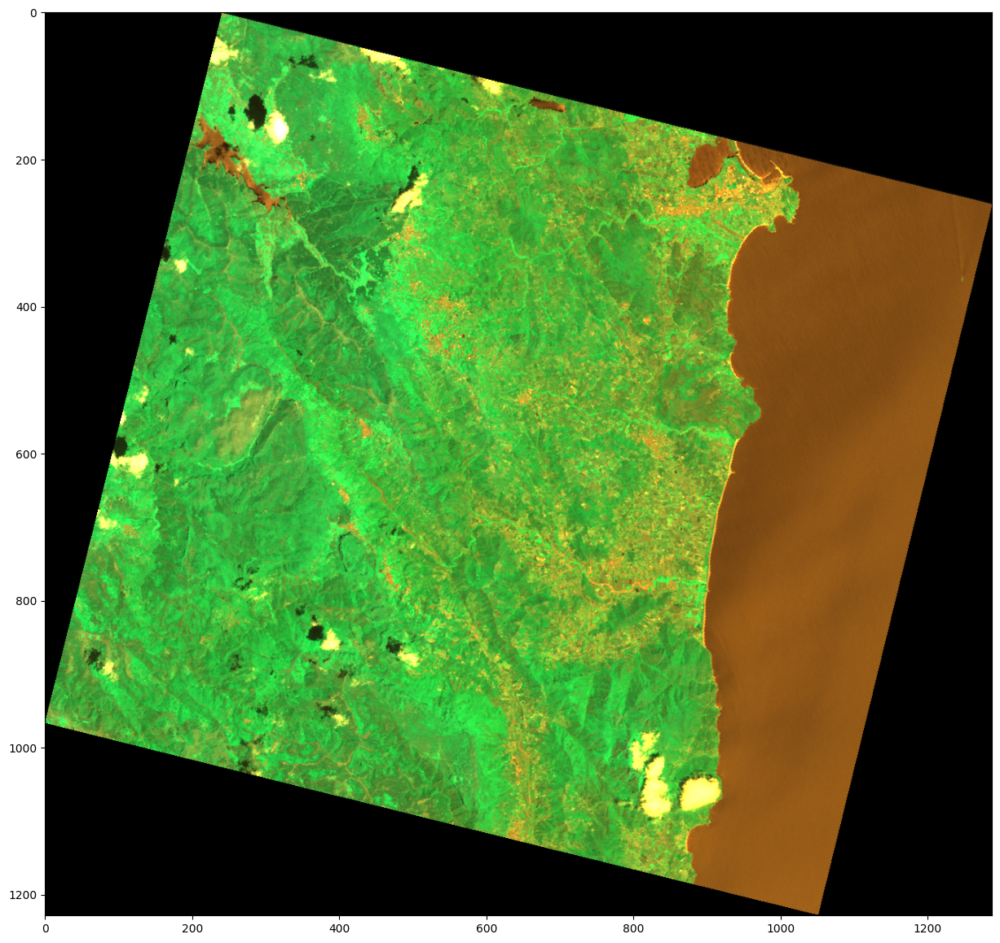

In [9]:
fig, axs = plt.subplots(figsize=(15, 15))
rgb_eop = eop.data["vnir"][0][..., [31, 18, 7]]
axs.imshow(rgb_eop * 3.5 / 300);

## 2. Spectral resampling <a name="spectral"></a>

An interpolation method based on spline interpolation is proposed for implementing the spectral resampling step. Gaussian smoothing is performed spectrally prior to resampling.

For each hyperspectral pixel Lp,l(λPRISMA_CW) at spatial position (p,l) in VNIR/SWIR Prisma cubes:

1) Compute the interpolation function fpl(λ)along the spectral axis λ as:
fp,l(λ) = spline_interp(x= λPRISMA_CW, y= Lp,l(λPRISMA_CW))

2) Evaluate the interpolation function fp,l(λ) at the Central Wavelengths λHYP_CW of the target hyperspectral sensor:
Lp,l(λ_HYP_CW) = fp,l(λ_HYP_CW)

The following task sorts the bands by increasing central wavelength and merges them into a single array.

Note that the `dataMask` feature can be used to find which pixels have valid data.

In [10]:
merge_and_sort_task = MergeAndSortTask(
    output_feature=(FeatureType.DATA, "BANDS_PRISMA"),
    cw_feature=(FeatureType.SCALAR_TIMELESS, "PRISMA_CW"),
)

In [11]:
eop = merge_and_sort_task(eop)

In [12]:
eop

EOPatch(
  data={
    BANDS_PRISMA: numpy.ndarray(shape=(1, 1229, 1288, 234), dtype=float32)
    swir: numpy.ndarray(shape=(1, 1229, 1288, 173), dtype=float32)
    vnir: numpy.ndarray(shape=(1, 1229, 1288, 66), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1229, 1288, 1), dtype=uint8)
  }
  scalar_timeless={
    PRISMA_CW: numpy.ndarray(shape=(234,), dtype=float32)
  }
  meta_info={
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.4554571174, 4427707.156956533)), crs=CR

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


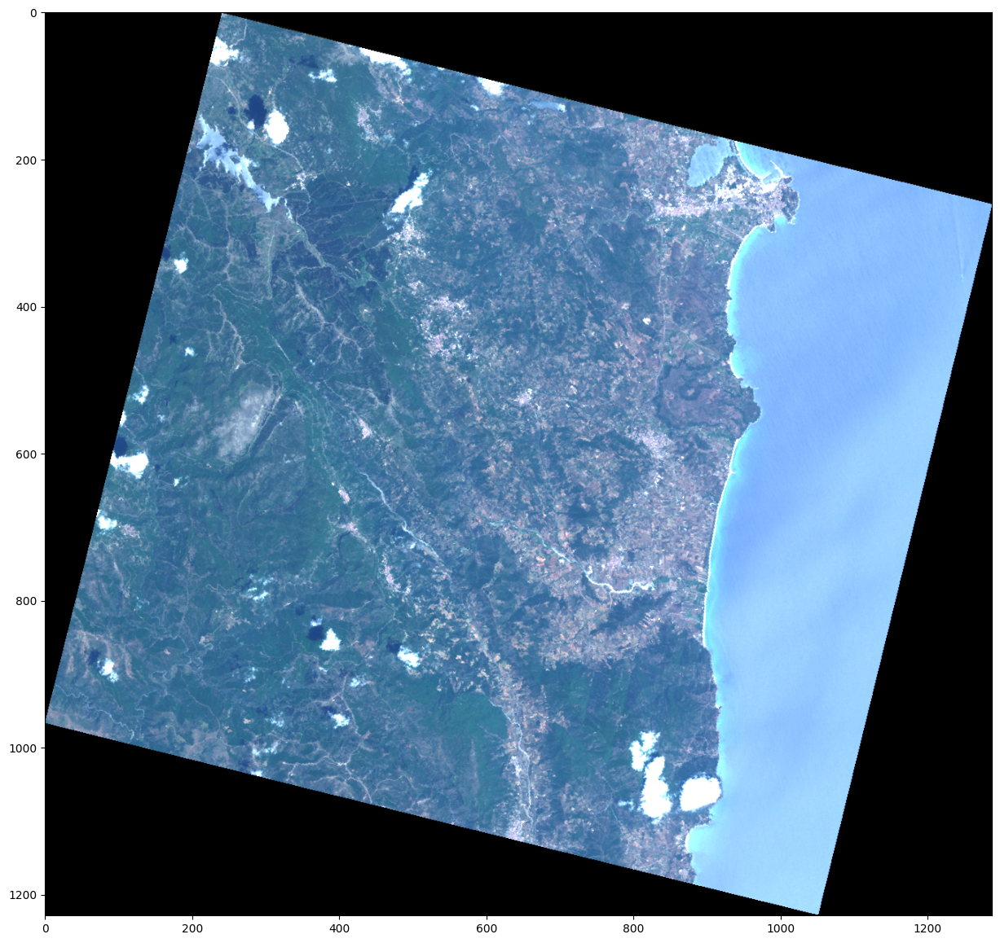

In [13]:
fig, axs = plt.subplots(figsize=(15, 15))
rgb_eop = eop.data["BANDS_PRISMA"][0][..., [31, 18, 7]]
axs.imshow(rgb_eop * 3.5 / 300);

The following task removes some bands that are outside of the spectrum of interest to speed up spline curve fitting. 

In [14]:
remove_bands_task = RemoveBandsTask(
    (FeatureType.DATA, "BANDS_PRISMA", "BANDS_PRISMA_CROP"),
    (FeatureType.SCALAR_TIMELESS, "PRISMA_CW", "PRISMA_CW_CROP"),
)

In [15]:
eop = remove_bands_task(eop)

In [16]:
eop

EOPatch(
  data={
    BANDS_PRISMA: numpy.ndarray(shape=(1, 1229, 1288, 234), dtype=float32)
    BANDS_PRISMA_CROP: numpy.ndarray(shape=(1, 1229, 1288, 80), dtype=float32)
    swir: numpy.ndarray(shape=(1, 1229, 1288, 173), dtype=float32)
    vnir: numpy.ndarray(shape=(1, 1229, 1288, 66), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1229, 1288, 1), dtype=uint8)
  }
  scalar_timeless={
    PRISMA_CW: numpy.ndarray(shape=(234,), dtype=float32)
    PRISMA_CW_CROP: numpy.ndarray(shape=(80,), dtype=float32)
  }
  meta_info={
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth:

Perform spectral resampling to HSI specifics. Gaussian smoothing is performed prior to resampling. The default sigma is derived considering the difference in spectral resolution between PRISMA and HSI.

In [17]:
spectral_resample_task = SpectralResamplingTask(
    (FeatureType.DATA, "BANDS_PRISMA_CROP", "BANDS_HSI"),
    (FeatureType.SCALAR_TIMELESS, "PRISMA_CW_CROP"),
    sigma=0.72,
)

In [18]:
eop = spectral_resample_task(eop)

  0%|          | 0/1582952 [00:00<?, ?it/s]

In [19]:
eop

EOPatch(
  data={
    BANDS_HSI: numpy.ndarray(shape=(1, 1229, 1288, 50), dtype=float64)
    BANDS_PRISMA: numpy.ndarray(shape=(1, 1229, 1288, 234), dtype=float32)
    BANDS_PRISMA_CROP: numpy.ndarray(shape=(1, 1229, 1288, 80), dtype=float32)
    swir: numpy.ndarray(shape=(1, 1229, 1288, 173), dtype=float32)
    vnir: numpy.ndarray(shape=(1, 1229, 1288, 66), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1229, 1288, 1), dtype=uint8)
  }
  scalar_timeless={
    PRISMA_CW: numpy.ndarray(shape=(234,), dtype=float32)
    PRISMA_CW_CROP: numpy.ndarray(shape=(80,), dtype=float32)
  }
  meta_info={
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


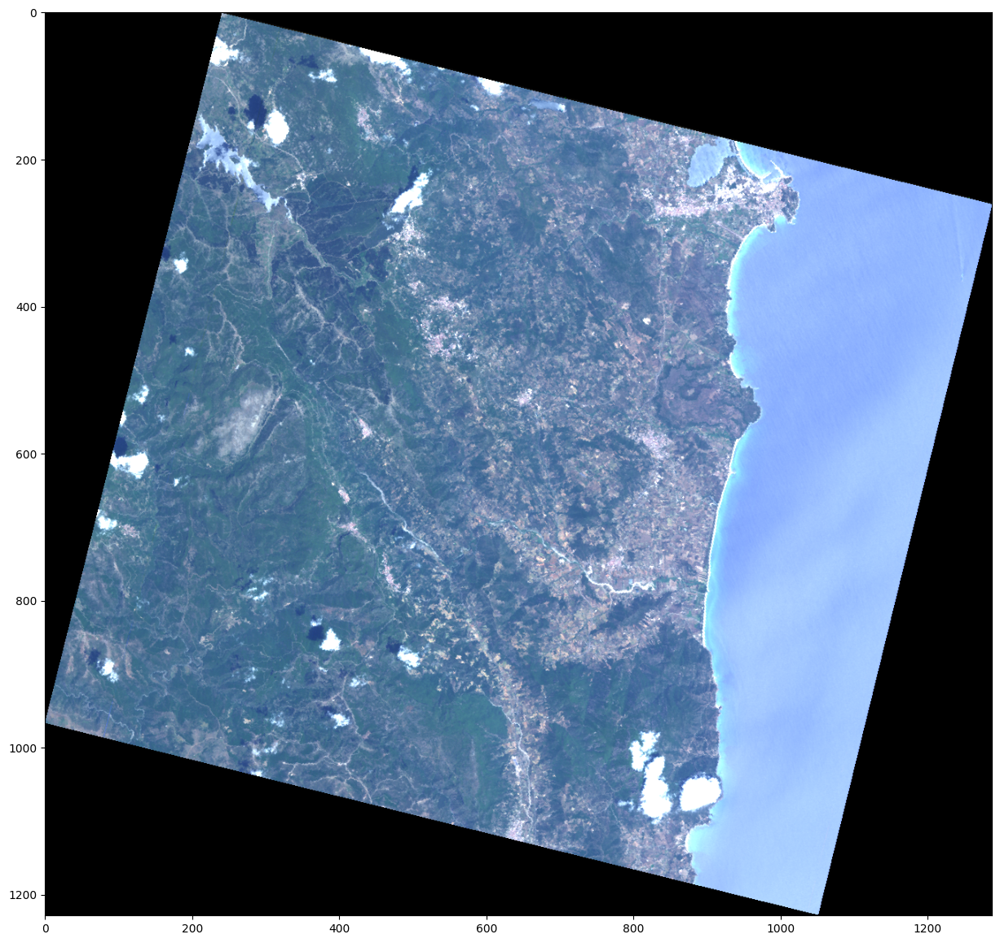

In [20]:
fig, axs = plt.subplots(figsize=(15, 15))
rgb_eop = eop.data["BANDS_HSI"][0][..., [18, 10, 1]]
axs.imshow(rgb_eop * 3.5 / 300);

Text(0.5, 0, 'Wavelength (nm)')

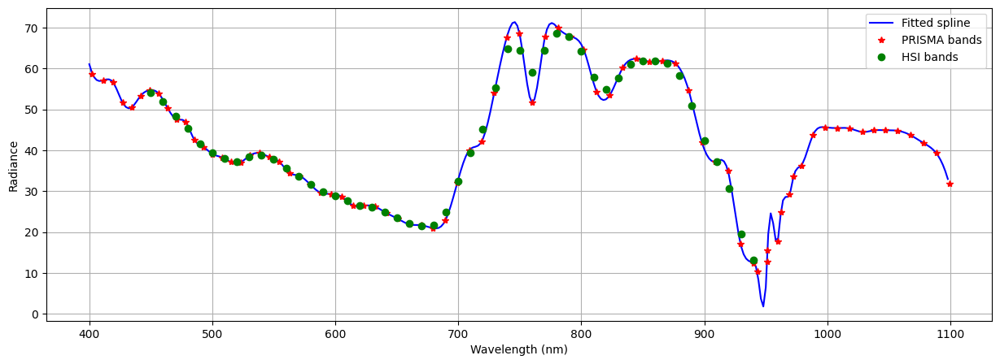

In [21]:
hidx, widx = 600, 600
x = eop.scalar_timeless["PRISMA_CW_CROP"]
y = eop.data["BANDS_PRISMA_CROP"][0][hidx, widx, :]
y_new = eop.data["BANDS_HSI"][0][hidx, widx, :]
spline = CubicSpline(x, y)

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(
    np.arange(400, 1100, 2),
    spline(np.arange(400, 1100, 2)),
    "-b",
    label="Fitted spline",
)
ax.plot(x, y, "*r", label="PRISMA bands")
ax.plot(HSI_CW, y_new, "og", label="HSI bands")
ax.grid()
ax.legend()
ax.set_ylabel("Radiance")
ax.set_xlabel("Wavelength (nm)")

## 3. Spatial resampling <a name="spatial"></a>

The task implements a resampling of the Prisma hyperspectral bands **from 30m** (or modified pixel spacing resulting from the intermediate UTM projection step of Prisma data) **to 45m**, through bicubic interpolation.

In [22]:
resize_task = ResizeTask(
    [
        (FeatureType.DATA, "BANDS_HSI", "BANDS_HSI_RES"),
        (FeatureType.MASK, "dataMask", "dataMask_RES"),
    ],
    pixel_size_new=HSI_PIX_SIZE,
    pixel_size_old=PRISMA_PIX_SIZE,
)

In [23]:
eop = resize_task(eop)

In [24]:
eop

EOPatch(
  data={
    BANDS_HSI_RES: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  meta_info={
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.4554571174, 4427707.156956533)), crs=CRS('32632'))
  timestamp=[datetime.datetime(2020, 6, 4, 10, 28, 29)]
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


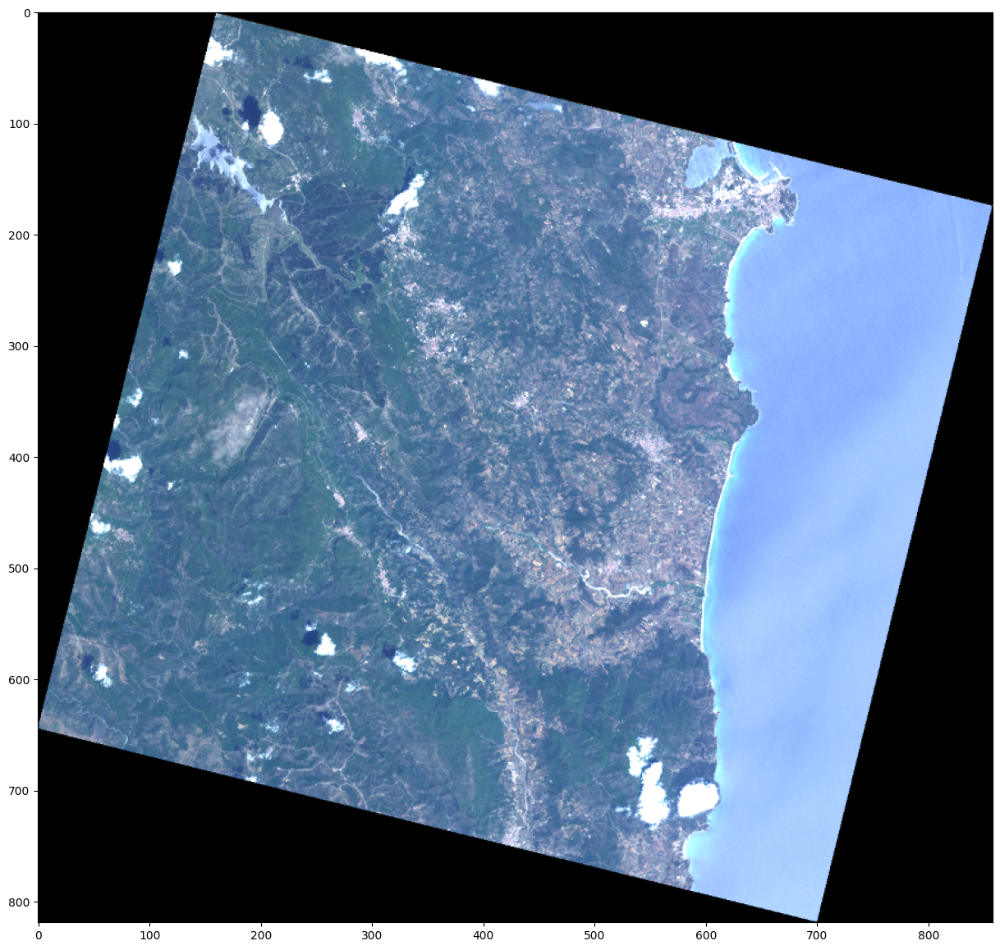

In [25]:
fig, axs = plt.subplots(figsize=(15, 15))
rgb_eop = eop.data["BANDS_HSI_RES"][0][..., [18, 10, 1]]
axs.imshow(rgb_eop * 3.5 / 300);

In [26]:
height_new, width_new = eop.get_spatial_dimension(FeatureType.DATA, "BANDS_HSI_RES")

Due to the fixed AOI, the actual pixel size might differ from the desired value.

In [27]:
(eop.bbox.upper_right[1] - eop.bbox.lower_left[1]) / height_new

45.01831501831502

In [28]:
(eop.bbox.upper_right[0] - eop.bbox.lower_left[0]) / width_new

45.03496503496503

## 4. Band-to-Band Misalignment <a name="misalignment"></a>

The task simulates a band-to-band misalignment noise, adding a relative, constant, and increasing shift to all bands starting from the reference band `BAND_450`, with an additional random component distributed as a normal Gaussian of N(0, 0.04). The total misalignment from `BAND_450` to `BAND_940` is of 10 pixels, resulting in a constant shift of 0.204 pixels between spectral bands.

In [29]:
misalignment_task = BandMisalignmentTask(
    (FeatureType.DATA, "BANDS_HSI_RES", "BANDS_HSI_MIS")
)

In [30]:
eop = misalignment_task(eop)

In [31]:
eop

EOPatch(
  data={
    BANDS_HSI_MIS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_RES: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.4554571174, 4427707.156956533)), crs=CRS('32632'))
  timestamp=[datetime.datetime(2020, 6, 4, 10, 28, 29)]
)

In [32]:
# With Nearest Neighbour interpolation, the effective shifts applied are rounded to integer values.
for shifts in eop.meta_info["Shifts"].values():
    print(shifts)

[(0.0, 0.0), (-0.19117314024549936, 0.012329903316480468), (-0.4473531278390711, 0.028607500108822813), (-0.6768562371024557, -0.03878382819844522), (-0.876251846073708, -0.04469881100303189), (-1.0941197168897356, -0.053403089934720184), (-1.2991162917743917, -0.05359816000842716), (-1.467029698064032, -0.05614709219596601), (-1.6072689435002396, -0.07506951145133729), (-1.8105505961323436, -0.12139073818627093), (-2.0133081832130544, -0.10499992387483978), (-2.2212028876828875, -0.09486947012138143), (-2.4401840626303875, -0.10133610327928637), (-2.636441987723295, -0.0951727915184337), (-2.8380166516354035, -0.10431003572421346), (-3.018379356365097, -0.13056763321688572), (-3.2446191830556064, -0.11079299462426763), (-3.4501749142400753, -0.05820971440079444), (-3.653354972971303, -0.04932004423796517), (-3.8650781794554554, -0.020166243344429003), (-4.080785633112864, 0.0178027349108056), (-4.3341741264568405, -0.013883806890375456), (-4.506793245814688, -0.008242542720904317), (-

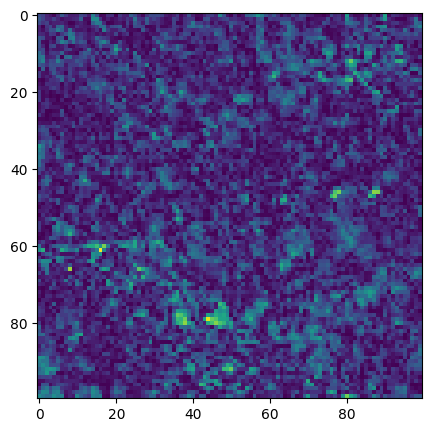

In [33]:
band_idx = -1

fig, axs = plt.subplots(figsize=(5, 5))
axs.imshow(
    np.abs(
        eop.data["BANDS_HSI_RES"][0][400:500, 400:500, band_idx]
        - eop.data["BANDS_HSI_MIS"][0][400:500, 400:500, band_idx]
    )
);

## 5. SNR <a name="snr"></a>

This step simulates noise according to the signal-toNoise (SNR) specifications of the optical system.

A compiled executable will perform the SNR and PSF calculation. 

Executables for the following Operating Systems (OSs) have been compiled:

 * Unix, `hsi-prisma_unix.bin`
 * Windows, `hsi-prisma_win.bin`
 * MacOS, `hsi-prisma_osx-arm64.bin` for ARM chips, `hsi-prisma_osx-x86_64.bin` for Intel chips
 
Download the suitable binary for your OS from this [link](https://cloud.sinergise.com/s/nYQ8gMEPreBomzF). 

Once downloaded, allow the operating system to run the file and make it executable (e.g. `chmod a+x hsi-prisma_unix.bin`). Then set the path to the executable in the cell below.

In [34]:
EXEC_PATH = "executables/hsi-prisma_unix.bin"

In [35]:
snr_task = HSICalculationTask(
    input_feature=(FeatureType.DATA, "BANDS_HSI_MIS"),
    output_feature=(FeatureType.DATA, "BANDS_HSI_SNR"),
    executable=EXEC_PATH,
    calculation="SNR",
)

In [36]:
eop = snr_task(eop)

/tmp/onefile_30787_1676279831_283765/hsi_calculations.py:100: RuntimeWarning: invalid value encountered in sqrt


In [37]:
eop

EOPatch(
  data={
    BANDS_HSI_MIS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_RES: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_SNR: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.4554571174, 4427707.156956533)), crs=CRS('32632'))
  timestamp=[datetim

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


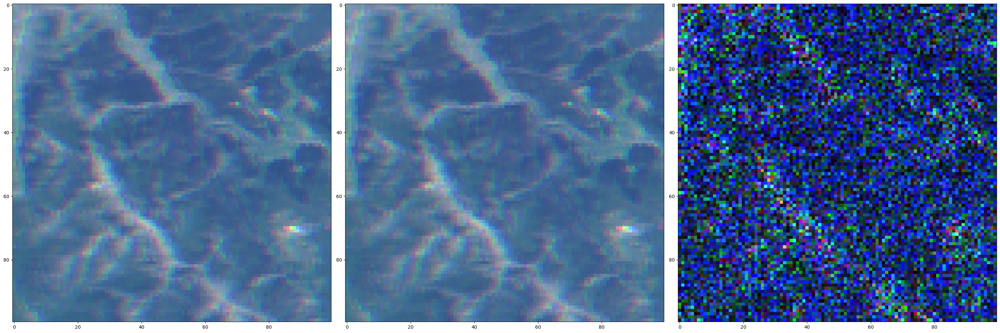

In [38]:
fig, axs = plt.subplots(figsize=(30, 10), ncols=3)
eop_mis = eop.data["BANDS_HSI_MIS"][0][200:300, 200:300, [18, 10, 1]]
eop_snr = eop.data["BANDS_HSI_SNR"][0][200:300, 200:300, [18, 10, 1]]
axs[0].imshow(eop_mis / 300 * 3.5)
axs[1].imshow(eop_snr / 300 * 3.5)
axs[2].imshow(np.abs(eop_mis - eop_snr))
plt.tight_layout()

## 6. Simulate Point Spread Function (PSF) Filtering <a name="psf"></a>

Step that simulates loss of signal due to limited bandwidth of the Module Transfer Function (MTF), which is equivalent to simulate the Point Spread Function (PSF) for the entire system, e.g. imager and platform.

The same executable as for SNR is used. If you have not downloaded it already, do so for your OS from this [link](https://cloud.sinergise.com/s/nYQ8gMEPreBomzF). Once downloaded, allow the operating system to run the file and make it executable (e.g. `chmod a+x hsi-prisma_unix.bin`). Then set the path to the executable in the cell below.

In [39]:
psf_filter_task = HSICalculationTask(
    input_feature=(FeatureType.DATA, "BANDS_HSI_SNR"),
    output_feature=(FeatureType.DATA, "BANDS_HSI_PSF"),
    executable=EXEC_PATH,
    calculation="PSF",
)

In [40]:
eop = psf_filter_task.execute(eop)

# check result:
eop

EOPatch(
  data={
    BANDS_HSI_MIS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_PSF: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_RES: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_SNR: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (56910

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


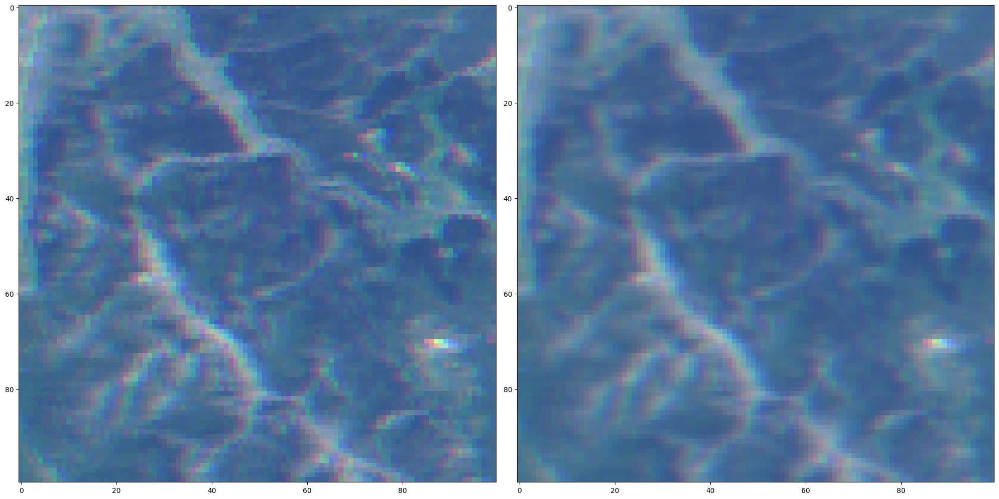

In [41]:
fig, axs = plt.subplots(figsize=(20, 10), ncols=2)
eop_res = eop.data["BANDS_HSI_SNR"][0][200:300, 200:300, [18, 10, 1]]
eop_snr = eop.data["BANDS_HSI_PSF"][0][200:300, 200:300, [18, 10, 1]]
axs[0].imshow(eop_res / 300 * 3.5)
axs[1].imshow(eop_snr / 300 * 3.5)
plt.tight_layout()

## 7. Compute L1C <a name="l1c"></a>

If the specified processing level is L1C, reflectances are computed from radiances. Otherwise, radiances are provided as output for L1B.

In [42]:
l1c_task = CalculateReflectanceTask(
    (FeatureType.DATA, "BANDS_HSI_PSF", "HSI_BANDS"), processing_level=PROCESSING_LEVEL
)

In [43]:
eop = l1c_task(eop)

In [44]:
eop

EOPatch(
  data={
    BANDS_HSI_MIS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_PSF: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_RES: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    BANDS_HSI_SNR: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    HSI_BANDS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


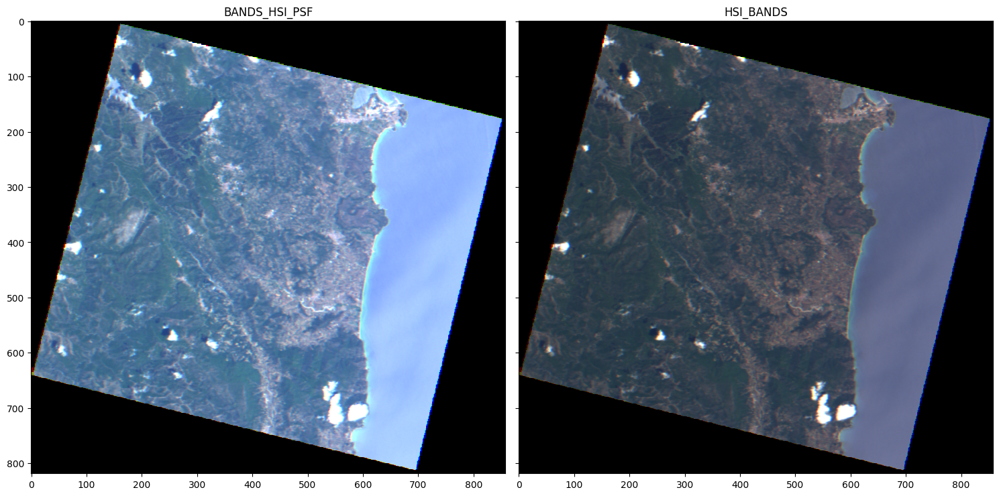

In [45]:
# plot difference dub to radiance to refelectance conversion if applied
t_idx = 0
viz_factor = 3.5 if PROCESSING_LEVEL.value == ProcessingLevels.L1C.value else 3.5 / 300
_, axes = plt.subplots(ncols=2, nrows=1, figsize=(15, 15), sharex=True, sharey=True)

axes[0].imshow(eop.data["BANDS_HSI_PSF"][t_idx][..., [18, 10, 1]] * 3.5 / 300)
axes[0].set_title(f"BANDS_HSI_PSF")
axes[1].imshow(eop.data["HSI_BANDS"][t_idx][..., [18, 10, 1]] * viz_factor)
axes[1].set_title(f"HSI_BANDS")
plt.tight_layout()

In [46]:
remove_features_task = RemoveFeatureTask(
    [
        (FeatureType.DATA, "BANDS_HSI_MIS"),
        (FeatureType.DATA, "BANDS_HSI_RES"),
        (FeatureType.DATA, "BANDS_HSI_SNR"),
        (FeatureType.DATA, "BANDS_HSI_PSF"),
    ]
)

In [47]:
eop = remove_features_task(eop)

In [48]:
eop

EOPatch(
  data={
    HSI_BANDS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.4554571174, 4427707.156956533)), crs=CRS('32632'))
  timestamp=[datetime.datetime(2020, 6, 4, 10, 28, 29)]
)

## 8. Tiling <a name="gridding"></a>

For creation of the training dataset, non-overlapping image patches of size 256x256 are created. When testing your algorithm, the image patches should possibly overlap to remove edge artefacts. The method might actually produce overlapping image patches at the bottom and right side of the image, if the image size is not exactly divisible by the image chip size. Feel free to modify the method to suit your application.

Change the parameters in the cell below to modify the size of the image patches and their overlap.

In [49]:
CELL_SIZE = 256
GRID_OVERLAP = 0.0

In [50]:
time_index = 0

FEATURE_NAMES = [
    (FeatureType.DATA, "HSI_BANDS"),
    (FeatureType.MASK, "dataMask_RES"),
]

gridding_tasks = []

for feature_type, feature_name in FEATURE_NAMES:
    gridding_tasks.append(
        GriddingTask(
            (feature_type, feature_name),
            (feature_type, f"{feature_name}-GRID_{time_index}"),
            (FeatureType.VECTOR_TIMELESS, f"{feature_name}-GRID_{time_index}"),
            size=CELL_SIZE,
            overlap=GRID_OVERLAP,
            resolution=HSI_PIX_SIZE,
            time_index=time_index,
        )
    )

In [51]:
eop = gridding_tasks[0].execute(eop)

In [52]:
eop

EOPatch(
  data={
    HSI_BANDS: numpy.ndarray(shape=(1, 819, 858, 50), dtype=float64)
    HSI_BANDS-GRID_0: numpy.ndarray(shape=(16, 256, 256, 50), dtype=float64)
  }
  mask={
    dataMask_RES: numpy.ndarray(shape=(1, 819, 858, 1), dtype=uint8)
  }
  vector_timeless={
    HSI_BANDS-GRID_0: geopandas.GeoDataFrame(columns=['pixel_geometry', 'geometry'], length=16, crs=EPSG:32632)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    cw_swir: numpy.ndarray(shape=(173,), dtype=float32)
    cw_swir_flags: numpy.ndarray(shape=(173,), dtype=uint8)
    cw_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    cw_vnir_flags: numpy.ndarray(shape=(66,), dtype=uint8)
    fwhm_swir: numpy.ndarray(shape=(173,), dtype=float32)
    fwhm_vnir: numpy.ndarray(shape=(66,), dtype=float32)
    offset_swir: 0.0
    offset_vnir: 0.0
    scalefac_swir: 100.0
    scalefac_vnir: 100.0
    sun_azimuth: 143.88954
    sun_zenith: 20.468327
  }
  bbox=BBox(((530466.4554571174, 4390837.156956533), (569106.45545711

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


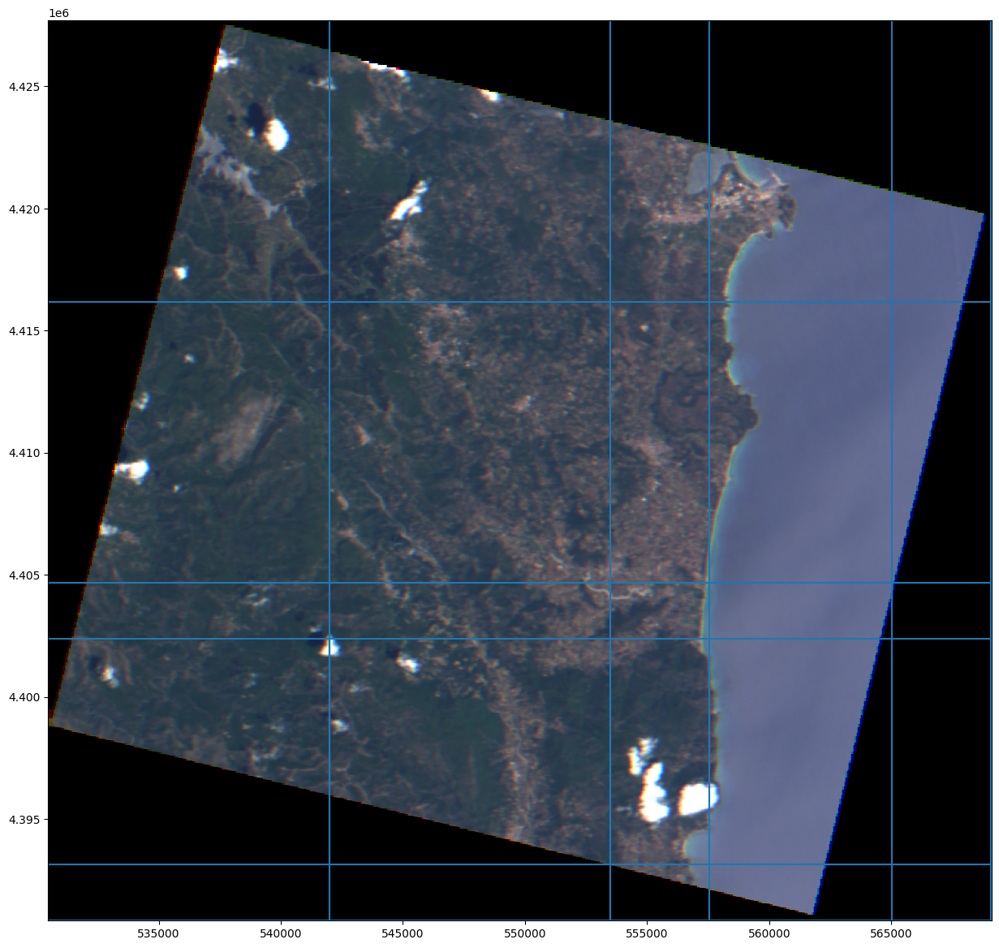

In [53]:
fig, axs = plt.subplots(figsize=(15, 15))
axs.imshow(
    viz_factor * eop.data["HSI_BANDS"][0][..., [18, 10, 1]], extent=get_extent(eop)
)
eop.vector_timeless[f"HSI_BANDS-GRID_{time_index}"].boundary.plot(ax=axs);

### 9. Export to Tiff <a name="export"></a>
 
Creates tiffs for a single timestamp. 

In [54]:
# create a folder for output tiffs
tiff_folder = "<folder_where_tiffs_are_written_to>"
os.makedirs(tiff_folder, exist_ok=True)

In [55]:
export_tiff_tasks = []

for feature_type, feature_name in FEATURE_NAMES:
    export_tiff_tasks.append(
        ExportGridToTiff(
            data_stack_feature=(feature_type, f"{feature_name}-GRID_{time_index}"),
            grid_feature=(
                FeatureType.VECTOR_TIMELESS,
                f"{feature_name}-GRID_{time_index}",
            ),
            out_folder=tiff_folder,
            time_index=time_index,
        )
    )

In [56]:
eop = export_tiff_tasks[0].execute(eop, prefix=filename)

## 10. Create workflow <a name="workflow"></a>

The above steps can be executed as an eo-learn workflov.

In [57]:
nodes = linearly_connect_tasks(
    preprocess_task,
    merge_and_sort_task,
    remove_bands_task,
    spectral_resample_task,
    resize_task,
    misalignment_task,
    snr_task,
    psf_filter_task,
    l1c_task,
    remove_features_task,
    *gridding_tasks,
    *export_tiff_tasks,
)
workflow = EOWorkflow(nodes)

## 11. Core dataset <a name="core-dataset"></a>

To get you started with your AI application at-the-edge, we simulated HSI imagery for 497 locations on Earth. The workflow as defined above was used to simulate L1C products for the locations and dates as specified in the provided `hsi-prisma-locations.gpkg` file. The code below was used to generate such images. 

If you wanted to simulate more HSI imagery, register and download the PRISMA tiles, and execute the workflow providing the path to the `.he5` files.

The PRISMA filename is used to save the tiff files, and can be cross-referenced to the locations of the HSI tiles generated from Sentinel-2, and the Φ-sat-2 imagery simulated in the OrbitalAI track. Bear in mind that there are 16 less images when simulating from Sentinel-2, since there were no matches for such locations and acquisition times.

You can download the pre-computed simulated images from the following public bucket

`https://s3.waw2-1.cloudferro.com/swift/v1/AUTH_afccea586afd4ef3bb11fe37dd1ddfbf/IMAGINe_Data/PRISMA/`.

The image patches are saved in zip archives named as the corresponding PRISMA images, e.g.

[`https://s3.waw2-1.cloudferro.com/swift/v1/AUTH_afccea586afd4ef3bb11fe37dd1ddfbf/IMAGINe_Data/PRISMA/PRS_L1_STD_OFFL_20191026162600_20191026162604_0001.zip`](https://s3.waw2-1.cloudferro.com/swift/v1/AUTH_afccea586afd4ef3bb11fe37dd1ddfbf/IMAGINe_Data/PRISMA/PRS_L1_STD_OFFL_20191026162600_20191026162604_0001.zip)

In [58]:
prisma_locations = gpd.read_file("hsi-prisma-locations.gpkg")

In [59]:
len(prisma_locations)

497

In [60]:
prisma_locations.head()

,cloud_cover,filename,date,order_id,geometry
0,0.000998,PRS_L1_STD_OFFL_20200924074020_20200924074024_...,24/09/2020,36765,POINT (53.70690 52.46040)
1,0.024464,PRS_L1_STD_OFFL_20210629073006_20210629073010_...,29/06/2021,36830,POINT (56.35450 55.34120)
2,0.000000,PRS_L1_STD_OFFL_20220827074222_20220827074226_...,27/08/2022,36839,POINT (55.63770 60.95850)
3,0.000000,PRS_L1_STD_OFFL_20210706074713_20210706074717_...,06/07/2021,36874,POINT (58.71460 66.10830)
4,4.225590,PRS_L1_STD_OFFL_20210622084113_20210622084118_...,22/06/2021,36875,POINT (59.01930 75.41460)


In [61]:
WORLD_GDF = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

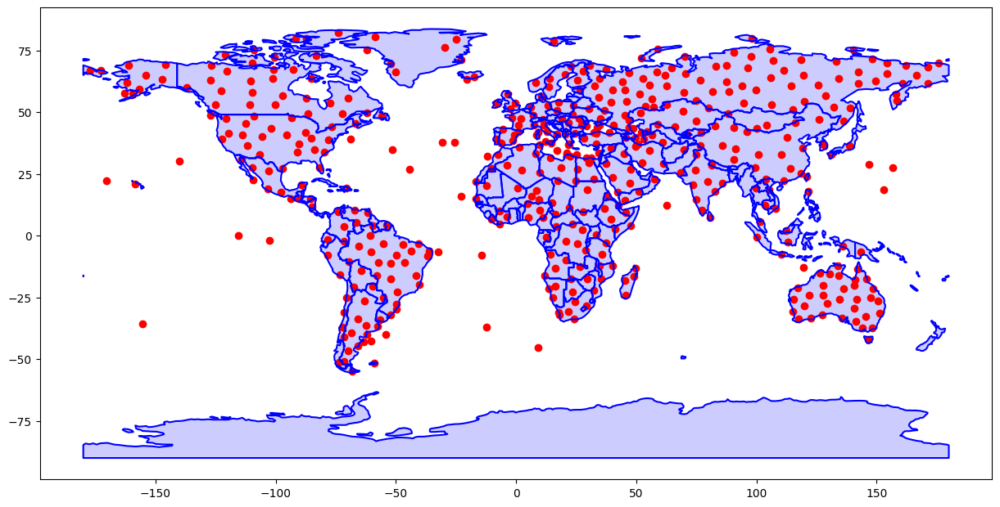

In [62]:
fig, ax = plt.subplots(figsize=(15, 10))
WORLD_GDF.plot(ax=ax, color="b", alpha=0.2)
WORLD_GDF.boundary.plot(ax=ax, color="b")
prisma_locations.plot(ax=ax, color="r");

Create arguments for workflow, specifying the names of the input PRISMA images.

In [63]:
exec_args = [
    {
        nodes[0]: {"filename": os.path.join(input_path, f"{filename}.he5")},
        nodes[-2]: {"prefix": filename},
        nodes[-1]: {"prefix": filename},
    }
    for filename in prisma_locations.filename.values
]

In [ ]:
eoexecutor = EOExecutor(workflow=workflow, execution_kwargs=exec_args, save_logs=True)

In [ ]:
eoexecutor.run(workers=4);

In [ ]:
eoexecutor.make_report()